<a href="https://colab.research.google.com/github/Soldatwar/Curso_EIE507/blob/main/Actividad_5/Actividad_5_GallardoFelipe_ID.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1><center>

</center></h1>
<font size="6"><center>
EIE 401
PROCESAMIENTO DIGITAL MULTIMEDIA
</center></font>


<center><h2>Actividad 5</h2></center>
<center><h3>Audio</h3></center>
<center><h3>Profesor: Jorge Cardenas</h3></center>

<center><h3>Por: Felipe Gallardo</h3></center>
<center><h5>Pontificia Universidad Catolica de Valparaiso</h5></center>


## 1. Aplique la transformada rápida de fourier a una señal de audio
<p align="justify">
El archivo de audio debe ser formato .WAV, con menos de 30 segundo de duración.


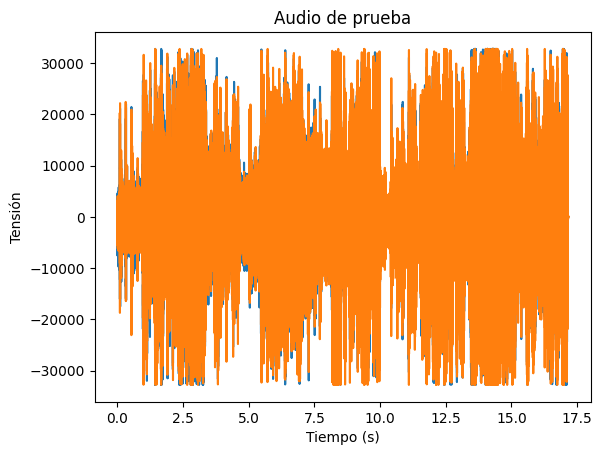

In [1]:
import numpy as np
import urllib.request
import matplotlib.pyplot as plt
from scipy.io import wavfile

# URL del archivo .wav
url_wav = 'https://raw.githubusercontent.com/Soldatwar/EIE-401_Gallardo_Felipe_Actividades/main/Actividad_5/PERDIO_SU_VIDA_EN_EL_LOL.wav'

# Descarga el archivo .wav
urllib.request.urlretrieve(url_wav, 'PERDIO_SU_VIDA_EN_EL_LOL.wav')

# Lee el archivo .wav
sample_rate, data = wavfile.read('PERDIO_SU_VIDA_EN_EL_LOL.wav')

# Crea un array de tiempo
time = np.arange(0, len(data)) / sample_rate

# Gráfica del archivo .wav
plt.plot(time, data)
plt.title('Audio de prueba')
plt.xlabel('Tiempo (s)')
plt.ylabel('Tensión')

plt.show()

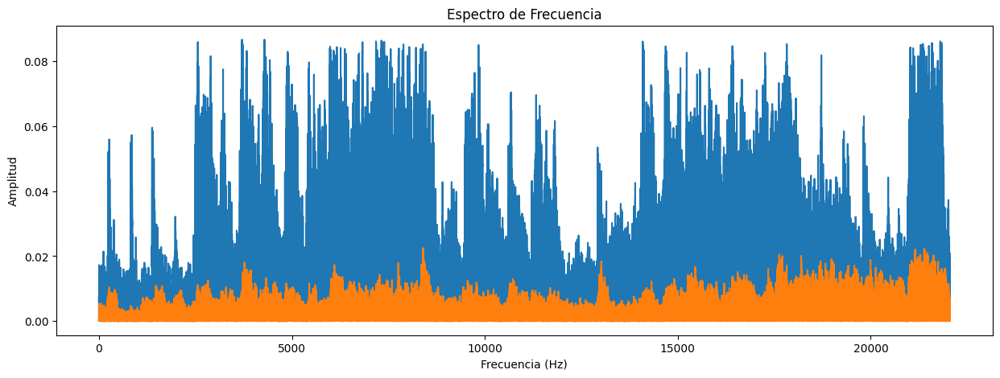

In [2]:
from scipy.fft import fft

# Aplicar la transformada rápida de Fourier
fft_vals = fft(data)

# Calcula las frecuencias absolutas
fft_abs = np.abs(fft_vals)

# Normalizar las frecuencias
norm_fft = fft_abs / len(data)

# Calcula las frecuencias para el eje x del gráfico
frequencies = np.linspace(0, sample_rate, len(norm_fft))

# Gráfica de la FFT
plt.figure(figsize=(15, 5))
plt.plot(frequencies[:len(frequencies)//2], norm_fft[:len(norm_fft)//2])
plt.title('Espectro de Frecuencia')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Amplitud')
plt.show()

## 2. Obtén el espectrograma de tu señal de audio

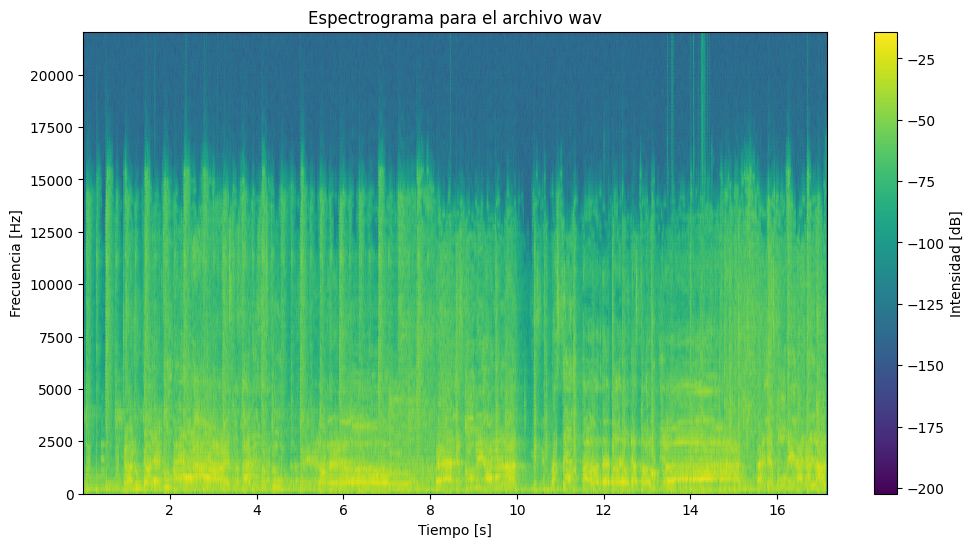

In [7]:
from scipy.signal import spectrogram

# Si el audio es estéreo (2 canales) toma solo un canal
if len(data.shape) > 1:
    data = data[:, 0]

# Normaliza los datos
data_norm = (data - np.mean(data)) / np.std(data)

# Calcula el espectrograma de los datos
frecuencias, tiempos, Sxx = spectrogram(data_norm, fs=sample_rate)

# Gráfica del espectrograma
plt.figure(figsize=(12, 6))
plt.pcolormesh(tiempos, frecuencias, 10 * np.log10(Sxx), shading='gouraud')
plt.colorbar(label='Intensidad [dB]')
plt.title('Espectrograma para el archivo wav')
plt.xlabel('Tiempo [s]')
plt.ylabel('Frecuencia [Hz]')
plt.show()

## 3. Slicing
Desarrolla un framento de código que te permita tomar una señal de audio y framentarla en N segmentos o slices. Debe asignar la longitud temporal de cada slice y el programa debe indicar el número de slices que quedan. Considera que al final puede quedar un slice de longitud diferente a todos los demas.

En el slicing debes también incluir un gap o overlap a lado y lado de cada uno de los fragmentos. Este overlap debe ser ajustable del número de muestras que constituyen dicho overlap.

![image.png](attachment:image.png)

Se han creado 28 segmentos.


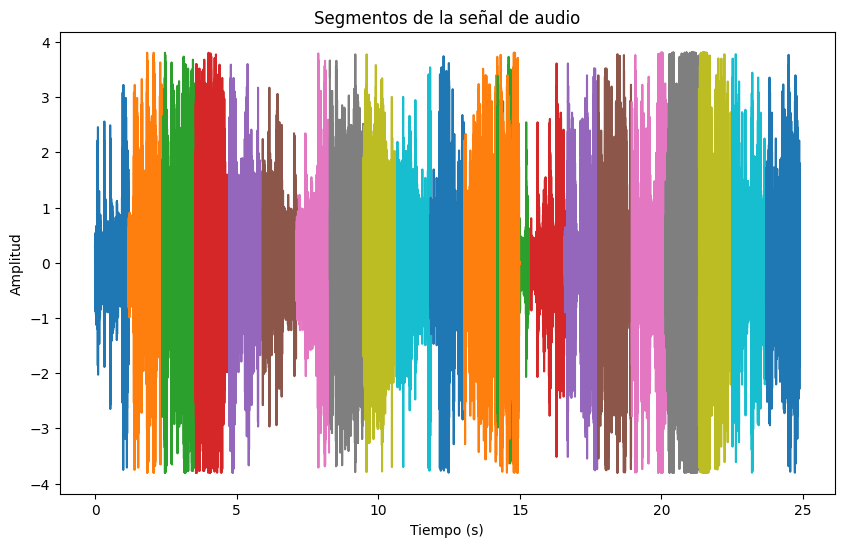

Reproduciendo todos los segmentos en conjunto...


In [10]:
"""
Prueba 1 de la creación de slicing con grafica y prueba de resultado de audio
"""
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
from IPython.display import Audio

# Si el audio es estéreo (2 canales) toma solo un canal
if len(data.shape) > 1:
    data = data[:, 0]

# Normaliza los datos
data_norm = (data - np.mean(data)) / np.std(data)

# Función para dividir la señal en segmentos
def slice_signal(data, sample_rate, slice_length, overlap):
    # Calcular el número de muestras en cada slice
    slice_samples = int(slice_length * sample_rate)
    overlap_samples = int(overlap * sample_rate)

    # Calcular el número total de slices
    total_slices = (len(data) - 2*overlap_samples) // (slice_samples - 2*overlap_samples)

    # Lista para almacenar los slices
    slices = []

    # Itera sobre la señal para crear los slices
    for i in range(total_slices):
        start = i * (slice_samples - overlap_samples)
        end = start + slice_samples + overlap_samples
        slices.append(data[start:end])

    # Añade el último slice si su longitud es diferente
    if len(data[end:]) > 0:
        slices.append(data[end:])

    return slices, total_slices

# Función para graficar los segmentos
def plot_slices(slices, sample_rate):
    plt.figure(figsize=(10, 6))
    for i, slice in enumerate(slices):
        time = np.arange(0, len(slice)) / sample_rate
        plt.plot(time + i * (len(slice) / sample_rate), slice)
    plt.title('Segmentos de la señal de audio')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.show()

# Prueba de las funciones
slice_length = 43424/44100  # Duración de cada slice en segundos (36 segmentos)
overlap = 0.2  # Duración del solapamiento en segundos
slices, total_slices = slice_signal(data_norm, sample_rate, slice_length, overlap)
print(f"Se han creado {total_slices} segmentos.")
plot_slices(slices, sample_rate)

"""
# Reproduce y grafica cada segmento
for i, slice in enumerate(slices):
    print(f"Reproduciendo segmento {i+1}...")
    display(Audio(slice, rate=sample_rate))
    time = np.arange(0, len(slice)) / sample_rate
    plt.figure(figsize=(10, 6))
    plt.plot(time, slice)
    plt.title(f'Segmento {i+1} de la señal de audio')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')
    plt.show()
"""

# Concatena los segmentos en una sola señal de audio
concatenated_signal = np.concatenate(slices)

# Audio señal de audio concatenada
print("Reproduciendo todos los segmentos en conjunto...")
display(Audio(concatenated_signal, rate=sample_rate))

In [12]:
"""
Prueba 2 aplicando codigo de eco al slicing anterior, resultado de audio
"""
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import spectrogram
from IPython.display import Audio

# Si el audio es estéreo (2 canales) toma solo un canal
if len(data.shape) > 1:
    data = data[:, 0]

# Normaliza los datos
data_norm = (data - np.mean(data)) / np.std(data)

# Función para dividir la señal en segmentos
def slice_signal(data, sample_rate, slice_length, overlap):
    # Número de muestras en cada slice
    slice_samples = int(slice_length * sample_rate)
    overlap_samples = int(overlap * sample_rate)

    # Calcular el número total de slices
    total_slices = (len(data) - 2*overlap_samples) // (slice_samples - 2*overlap_samples)

    # Lista para almacenar los slices
    slices = []

    # Itera sobre la señal para crear los slices
    for i in range(total_slices):
        start = i * (slice_samples - overlap_samples)
        end = start + slice_samples + overlap_samples
        slices.append(data[start:end])

    # Añadir el último slice si su longitud es diferente (para evitar error de tamaño)
    if len(data[end:]) > 0:
        slices.append(data[end:])

    return slices, total_slices

# Prueba de las funciones
slice_length = 43424/44100  # Duración de cada slice en segundos (36 segmentos)
overlap = 0.2  # Duración del solapamiento en segundos
slices, total_slices = slice_signal(data_norm, sample_rate, slice_length, overlap)
print(f"Se han creado {total_slices} segmentos.")

# Desplazamiento para el eco
overlap_samples = int(sample_rate * overlap)  # muestras de solapamiento

# Señal de audio vacía para el eco
echo_signal = np.zeros_like(concatenated_signal)

# Suma cada segmento a la señal de eco desplazado en el tiempo
for i, slice in enumerate(slices):
    start = i * (len(slice) - overlap_samples)
    end = start + len(slice)
    echo_signal[start:end] += slice

# Normaliza la señal de eco para evitar la saturación
echo_signal /= np.max(np.abs(echo_signal))

# Audio señal de eco
print("Reproduciendo todos los segmentos con efecto de eco...")
display(Audio(echo_signal, rate=sample_rate))


Se han creado 28 segmentos.
Reproduciendo todos los segmentos con efecto de eco...


## 3.1 Slicing usando Pytorch de la señal obtenida en el primer punto.
Debes crear un array con los slices creados a partir de tensores en pytorch.
Grafica un par de tus slices y reproduce el audio.


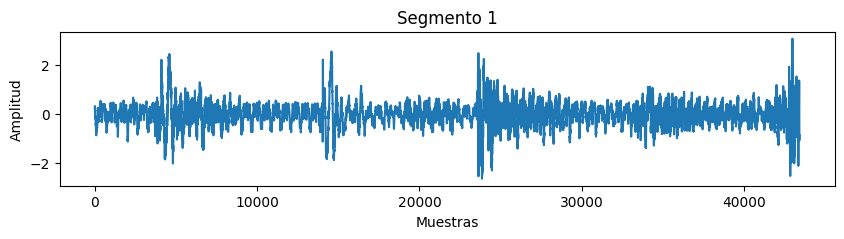

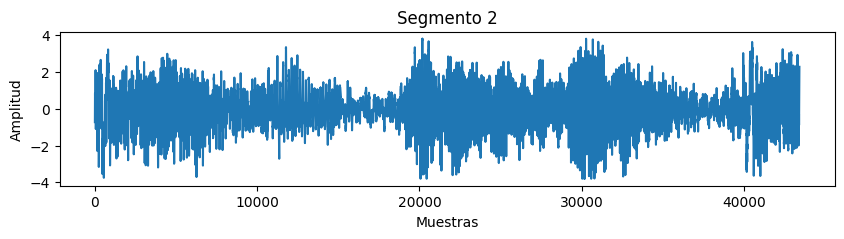

In [30]:
import torch
import matplotlib.pyplot as plt
from scipy.io.wavfile import write

# Convertir los datos a un tensor de PyTorch
data_tensor = torch.from_numpy(data_norm)

# Número de muestras en cada slice
slice_samples = int(slice_length * sample_rate)

# Lista para almacenar los slices
slices = []

# Iterar sobre la señal para crear los slices
for i in range(0, len(data_tensor), slice_samples):
    end = i + slice_samples
    if end > len(data_tensor):
        break  # Descartar el último segmento si su longitud es menor
    slice = data_tensor[i:end]
    slices.append(slice)

# Convertir la lista de slices a un tensor de PyTorch
slices_tensor = torch.stack(slices)

# Grafica de slices
for i in range(2):
    plt.figure(figsize=(10, 2))
    plt.plot(slices_tensor[i].numpy())
    plt.title(f'Segmento {i+1}')
    plt.xlabel('Muestras')
    plt.ylabel('Amplitud')
    plt.show()

    # Audio del slice 1
    display(Audio(slices_tensor[i].numpy(), rate=sample_rate))

    # Audio del slice 2
    write(f'slice_{i+1}.wav', sample_rate, slices_tensor[i].numpy())

## 4. Filtro Butterworth para una señal de audio.
Diseña y aplica un filtro butterworth a tu señal de audio.
Muestra un gráfico con la respuesta del filtro butterworth y explica el resultado.

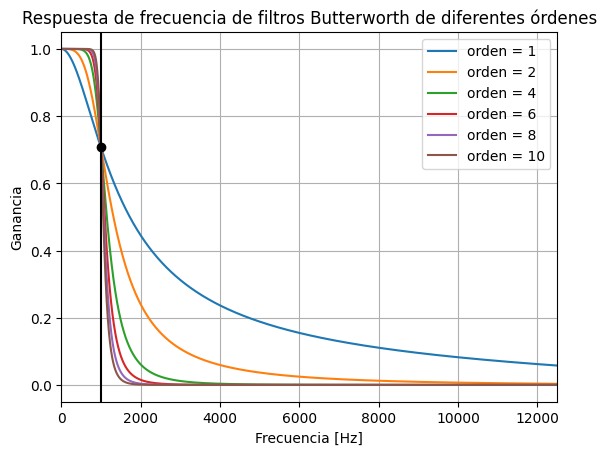

In [29]:
from scipy.signal import butter, lfilter, freqz
import matplotlib.pyplot as plt
import numpy as np

# Diseño del filtro
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

# Parámetros del filtro
fs = sample_rate       # frecuencia de muestreo
cutoff = 1000.0  # frecuencia de corte deseada del filtro, Hz
orders = [1, 2, 4, 6, 8, 10]  # diferentes órdenes para probar

# Aplica el filtro de diferentes órdenes y grafica la respuesta
for order in orders:
    # Obtén los coeficientes del filtro
    b, a = butter_lowpass(cutoff, fs, order)

    # Aplica el filtro
    y = butter_lowpass_filter(data_tensor.numpy(), cutoff, fs, order)

    # Grafica del filtro
    w, h = freqz(b, a, worN=8000)
    plt.plot(0.5*fs*w/np.pi, np.abs(h), label=f"orden = {order}")

plt.plot(cutoff, 0.5*np.sqrt(2), 'ko')
plt.axvline(cutoff, color='k')
plt.xlim(0, 12500)
plt.title("Respuesta de frecuencia de filtros Butterworth de diferentes órdenes")
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Ganancia')
plt.grid(True)
plt.legend()
plt.show()


In [27]:
"""
Prueba de audio filtrado de los ordenes usados
"""
# Aplica el filtro de diferentes órdenes y grafica la respuesta
for order in orders:
    # Obtén los coeficientes del filtro
    b, a = butter_lowpass(cutoff, fs, order)

    # Aplica el filtro
    y = butter_lowpass_filter(data_tensor.numpy(), cutoff, fs, order)

    # Guarda la señal de audio filtrada como un archivo .wav
    write(f'audio_filtrado_orden_{order}.wav', sample_rate, y)

    # Reproduce la señal de audio filtrada
    print(f"Audio filtrada para el orden {order}...")
    display(Audio(y, rate=sample_rate))


Reproduciendo la señal de audio filtrada para el orden 1...


Reproduciendo la señal de audio filtrada para el orden 2...


Reproduciendo la señal de audio filtrada para el orden 4...


Reproduciendo la señal de audio filtrada para el orden 6...


Reproduciendo la señal de audio filtrada para el orden 8...


Reproduciendo la señal de audio filtrada para el orden 10...


Slicing: Al realizar la primera prueba de la segmentación, variando el tamaño y el solapado en segundos, se obtiene una cierta cantidad de segmentos con más o menos tiempo de solapado. Sin embargo, al realizar la prueba de audio, no se produce un solapado como esperaba, reproduciendo ambas secciones de forma simultánea en puntos específicos. Luego de esto, realicé una prueba agregando un eco para obtener una versión del audio donde, en el intervalo en que los segmentos se solapan, estos sean reproducidos de forma simultánea.

Filtro Butterworth: La implementación del filtro Butterworth es un paso crucial para eliminar ciertas frecuencias de la señal de audio. Se diseña y aplica un filtro Butterworth de diferentes órdenes, siendo útil para entender cómo el filtro afecta a la señal de audio y cómo cambia la respuesta del filtro con diferentes órdenes. A medida que aumenta el orden del filtro, la transición entre la banda de paso y la banda de rechazo se vuelve más pronunciada. Esto quiere decir que un filtro de orden superior tiene una caída más rápida después de la frecuencia de corte, atenuando las frecuencias no deseadas más rápidamente. Por ejemplo, para el caso del orden 10, se puede escuchar un filtrado incorrecto en términos de nitidez de audio, dando un audio apagado. Esto puede ser por atenuar las frecuencias altas de forma tan abrupta.

## 4. Referencias
<p align="justify">
    
[Análisis espectral para audio] https://ccrma.stanford.edu/~jos/mdft/mdft-python.html

[Análisis espectral] https://currents.soest.hawaii.edu/ocn_data_analysis/_static/Spectrum.html


In [14]:
!pip install sounddevice